# Seminar 1. EEG analysis

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/drive/1H81W_DpkHv-ZC9bEbOBW9zfcOe7SCDnR?usp=sharing)

**Plan**

1. Read and visualize the data
2. Preprocess the data
3. Use ICA for noise reduction
4. Compute ERP and plot topomaps for ERP
5. Compute beta band envelopes for ERP
6. Compute coherence

## Part 1

All preprocessing and some data analysis of EEG data can be done using the [Python library MNE](https://mne.tools/stable/auto_tutorials/index.html).

In [ ]:
# For Colab only
# !pip install mne

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.4/7.4 MB 29.1 MB/s eta 0:00:00


In [ ]:
import mne
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

In [ ]:
not in colab
%matplotlib notebook
# in colab
# %matplotlib inline

mne.io includes the funtions for different EEG-record formats:
https://mne.tools/stable/documentation/implementation.html#supported-data-formats

We will work with data for one patient from [EEG Motor Movement/Imagery Dataset](https://www.physionet.org/content/eegmmidb/1.0.0/).

In [ ]:
# !wget "https://www.physionet.org/files/eegmmidb/1.0.0/S003/S003R03.edf"

--2024-09-05 23:44:03--  https://www.physionet.org/files/eegmmidb/1.0.0/S003/S003R03.edf
Resolving www.physionet.org (www.physionet.org)... 18.18.42.54
Connecting to www.physionet.org (www.physionet.org)|18.18.42.54|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2596896 (2.5M) [application/octet-stream]
Saving to: ‘S003R03.edf’

S003R03.edf         100%[===================>]   2.48M   663KB/s    in 3.9s    

2024-09-05 23:44:08 (643 KB/s) - ‘S003R03.edf’ saved [2596896/2596896]



In [ ]:
# !wget "https://www.physionet.org/files/eegmmidb/1.0.0/S003/S003R03.edf.event"

--2024-09-05 23:44:10--  https://www.physionet.org/files/eegmmidb/1.0.0/S003/S003R03.edf.event
Resolving www.physionet.org (www.physionet.org)... 18.18.42.54
Connecting to www.physionet.org (www.physionet.org)|18.18.42.54|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 638 [text/plain]
Saving to: ‘S003R03.edf.event’

S003R03.edf.event   100%[===================>]     638  --.-KB/s    in 0s      

2024-09-05 23:44:10 (279 MB/s) - ‘S003R03.edf.event’ saved [638/638]



In [ ]:
# !ls

S003R03.edf  S003R03.edf.event	sample_data


In [ ]:
sample = mne.io.read_raw_edf('S003R03.edf', verbose=False, preload=True)

Get some info about a record

In [ ]:
sample.info

<Info | 8 non-empty values
 bads: []
 ch_names: Fc5., Fc3., Fc1., Fcz., Fc2., Fc4., Fc6., C5.., C3.., C1.., ...
 chs: 64 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 80.0 Hz
 meas_date: 2009-08-12 16:15:00 UTC
 nchan: 64
 projs: []
 sfreq: 160.0 Hz
 subject_info: 3 items (dict)
>

In [ ]:
# Sampling frequency
sample.info['sfreq']

160.0

In [ ]:
# Length in seconds
len(sample) / sample.info['sfreq']

125.0

In [ ]:
# Number of channels
len(sample.ch_names)

64

### Channel selection and adding a montage

In [ ]:
sample.ch_names[:3]

['Fc5.', 'Fc3.', 'Fc1.']

In [ ]:
# fix trailing dots in channel names
# use sample.rename_channels(map)

# YOUR CODE HERE
map = {}
for ch in sample.ch_names:
    map[ch] = ch.replace(".", "")
sample.rename_channels(map)

<RawEDF | S003R03.edf, 64 x 20000 (125.0 s), ~9.8 MB, data loaded>

In [ ]:
sample.ch_names[:3]

['Fc5', 'Fc3', 'Fc1']

In [ ]:
# 19 channels from International 10-20 system. no A1 and A2 here
# Be careful. Pure 10-20 labeling differs from high-resolution montages
# In MNE, 10-20 montage is actually an extended high-resulution version of 10-20
# FYI, mapping from pure 10-20 to high-resolution versions
# T3 = T7
# T4 = T8
# T5 = P7
# T6 = P8

channels_to_use = [
    # prefrontal
    'Fp1',
    'Fp2',
    # frontal
    'F7',
    'F3',
    'F4',
    'Fz',
    'F8',
    # central and temporal
    'T7',
    'C3',
    'Cz',
    'C4',
    'T8',
    # parietal
    'P7',
    'P3',
    'Pz',
    'P4',
    'P8',
    # occipital
    'O1',
    'O2',
]

In [ ]:
sample_1020 = sample.copy().pick(channels_to_use)

# check that everything is OK
assert len(channels_to_use) == len(sample_1020.ch_names)

In [ ]:
ten_twenty_montage = mne.channels.make_standard_montage('standard_1020')
len(ten_twenty_montage.ch_names)

94

In [ ]:
sample_1020.set_montage(ten_twenty_montage)

<RawEDF | S003R03.edf, 19 x 20000 (125.0 s), ~2.9 MB, data loaded>

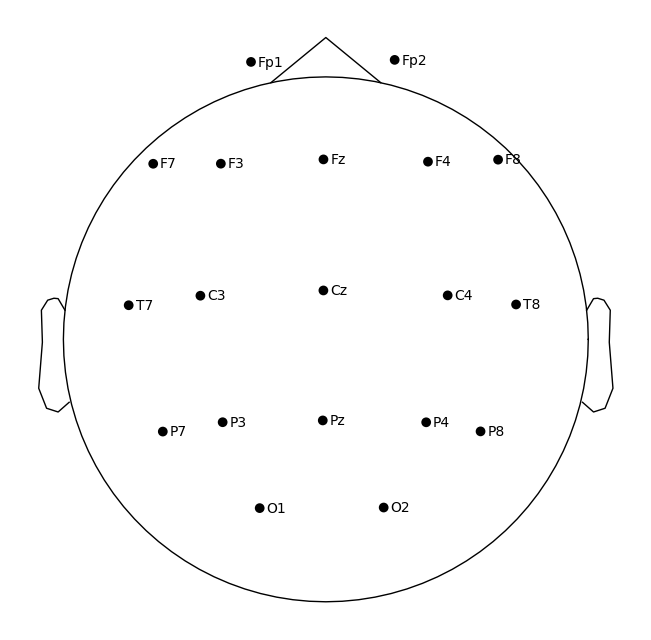

In [ ]:
sample_1020.plot_sensors(show_names=True);

### Explore the signals

Effective window size : 12.800 (s)
Plotting power spectral density (dB=True).


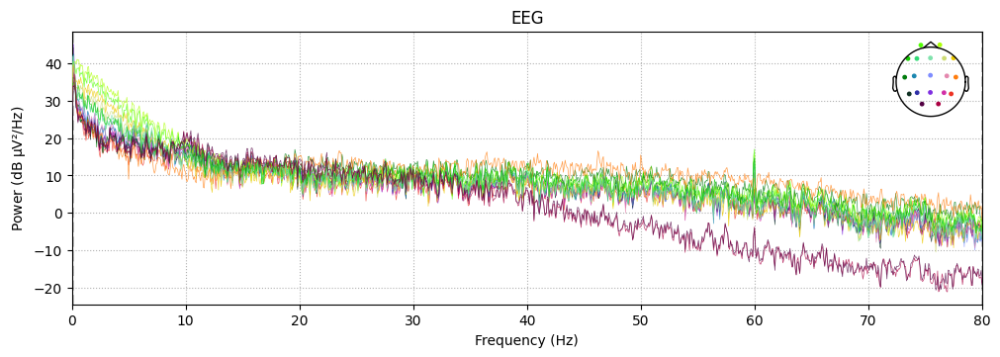

In [ ]:
sample_1020.compute_psd().plot();

Do you see peaks connected to power line noise?

The [notch filter's](https://mne.tools/stable/generated/mne.filter.notch_filter.html#mne-filter-notch-filter) purpose is to filter out activity at a specific frequency (rather than a frequency range). Because the alternating current in standard electric outlets in North America oscillates at 60 Hz, electric fields produced by the 60-Hz activity in the environment that surrounds us in our indoor environments frequently contaminates the EEG. Sixty-hertz notch filters (filters designed specifically to filter out 60-Hz activity) are used to attenuate or eliminate this unwanted signal. In countries where line frequencies are 50 Hz, 50-Hz notch filters are used for the same purpose.

#### Band-pass filtering

It's better to remove low-freq components < 1 Hz and high-freq > 50Hz (non-informative for EEG)

Let's use IIR filter.

In [ ]:
sample_1020.filter(l_freq=1, h_freq=50, method='iir')

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 50 Hz

IIR filter parameters
---------------------
Butterworth bandpass zero-phase (two-pass forward and reverse) non-causal filter:
- Filter order 16 (effective, after forward-backward)
- Cutoffs at 1.00, 50.00 Hz: -6.02, -6.02 dB



<RawEDF | S003R03.edf, 19 x 20000 (125.0 s), ~2.9 MB, data loaded>

Effective window size : 12.800 (s)
Plotting power spectral density (dB=True).


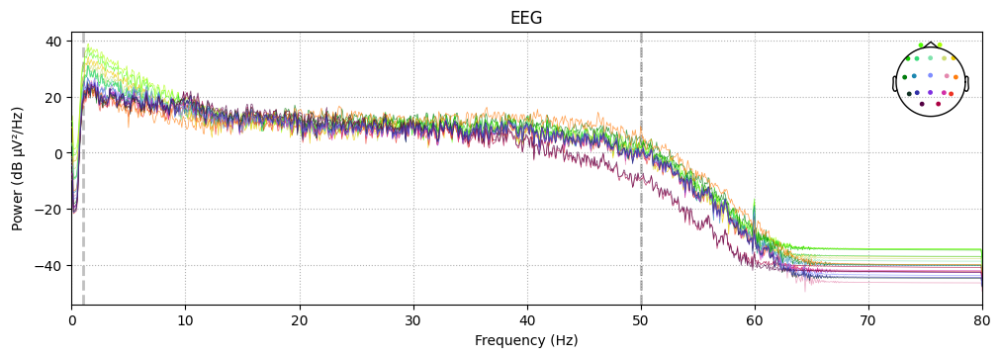

In [ ]:
# Plot psd after filtering

# YOUR CODE HERE

#### Plot EEG signals

Using matplotlib as 2D backend.


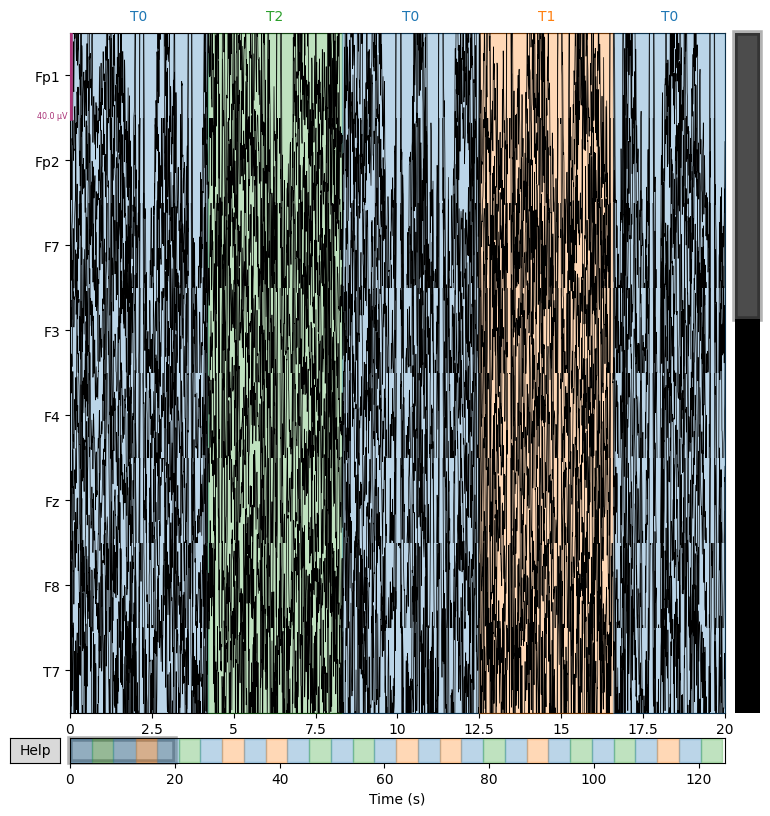

In [ ]:
sample_1020.plot(n_channels=8, duration=20);

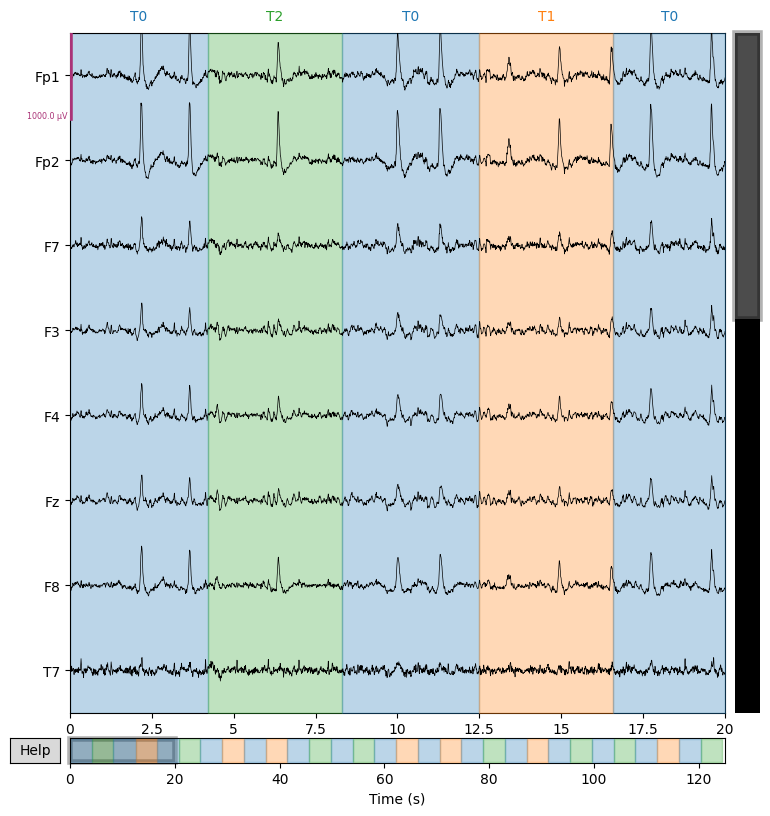

In [ ]:
# Plot in better scale. Use 'scalings' argument

# YOUR CODE HERE

### Extracting events

Mne has several functions for event selection.

* `mne.find_events` is used when events are stored in trigger channels (e.g. FIFF format)
* `mne.events_from_annotations` is used for when events are stored in annotations (EDF+ format)
    
Look for documentation for your EEG-record format

Here we have EDF+ format

In [ ]:
events, events_dict = mne.events_from_annotations(sample_1020)

Used Annotations descriptions: ['T0', 'T1', 'T2']


In [ ]:
events_dict

{'T0': 1, 'T1': 2, 'T2': 3}

In [ ]:
events[:5]

array([[   0,    0,    1],
       [ 672,    0,    3],
       [1328,    0,    1],
       [2000,    0,    2],
       [2656,    0,    1]])

**Epochs** objects are a data structure for representing and analyzing equal-duration chunks of the EEG/MEG signal. Epochs are most often used to represent data that is time-locked to repeated experimental events. The Raw object and the events array are the bare minimum needed to create an Epochs object, which we create with the `mne.Epochs` class constructor.

However, you will almost surely want to change some of the other default parameters. Here we’ll change `tmin` and `tmax` (the time relative to each event at which to start and end each epoch).

In [ ]:
epochs = mne.Epochs(sample_1020, events,  tmin=-0.5, tmax=0.8, preload=True)

Not setting metadata
30 matching events found
Setting baseline interval to [-0.5, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 30 events and 209 original time points ...
1 bad epochs dropped


In [ ]:
pd.DataFrame(epochs.events, columns=['_', '__', 'event_id'])['event_id'].value_counts()

,count
event_id,
1,14
3,8
2,7


Check that length is right

In [ ]:
for epoch in epochs:
    break
epoch.shape

(19, 209)

In [ ]:
epoch.shape[1] / sample_1020.info['sfreq']

1.30625

In [ ]:
sample_1020.to_data_frame().shape

(20000, 20)

In [ ]:
df = epochs.to_data_frame()
df.head(3).iloc[:, :10]

,time,condition,epoch,Fp1,Fp2,F7,F3,F4,Fz,F8
0,-0.50000,3,1,236.675891,244.275703,125.936913,88.829681,112.445086,73.438632,145.805904
1,-0.49375,3,1,175.970007,183.425016,103.803572,63.009365,82.687750,48.730906,115.749079
2,-0.48750,3,1,127.095181,132.985975,61.669835,31.478465,62.299189,33.384794,93.870855


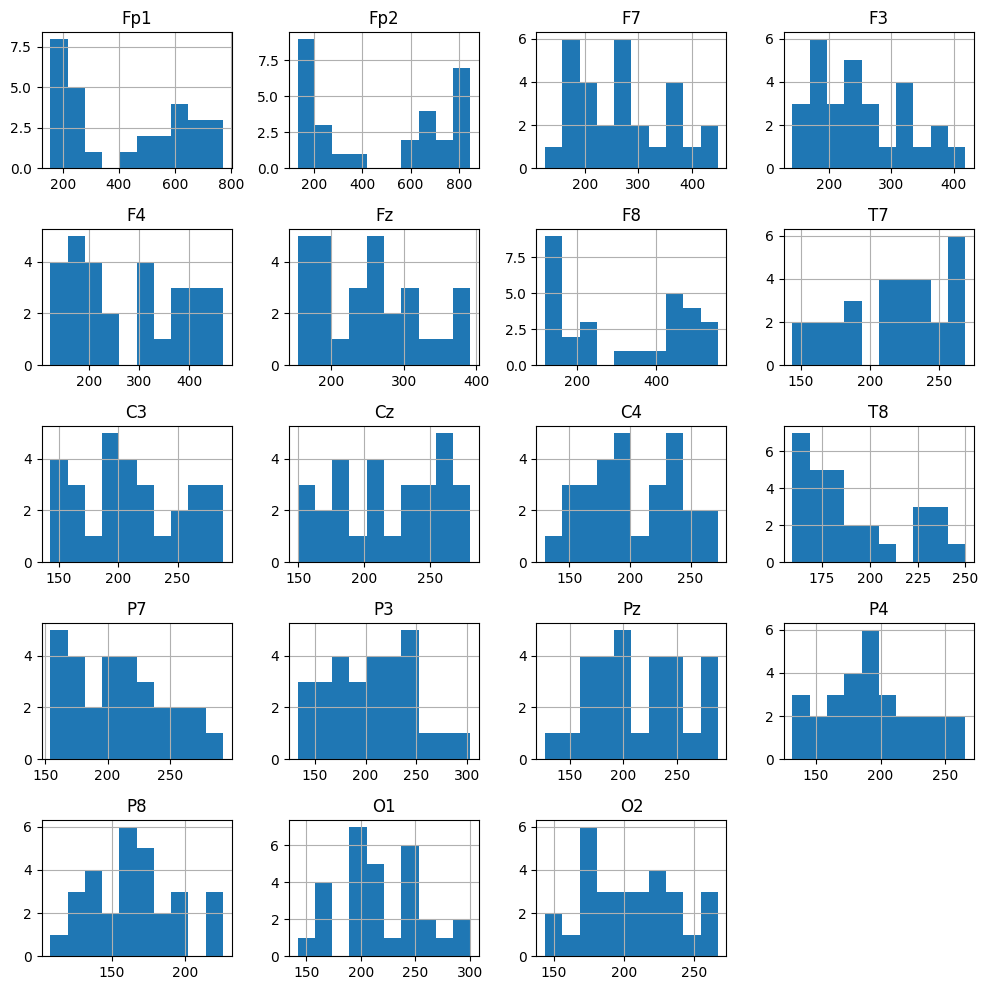

In [ ]:
df[sample_1020.ch_names + ['epoch']].groupby('epoch').agg(lambda arr: arr.max() - arr.min()).hist(figsize=[10, 10]);
plt.tight_layout()

Note also that the Epochs constructor accepts parameters `reject` for rejecting individual epochs based on signal amplitude.

In [ ]:
epochs = mne.Epochs(sample_1020, events,  tmin=-0.5, tmax=0.8, reject={'eeg': 600e-6}, preload=True, baseline=(-.1, 0))

Not setting metadata
30 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 30 events and 209 original time points ...
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
15 bad epochs dropped


PSD on epochs differs from the raw. More averaging is used

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
    Using multitaper spectrum estimation with 7 DPSS windows
Plotting power spectral density (dB=True).
Averaging across epochs before plotting...


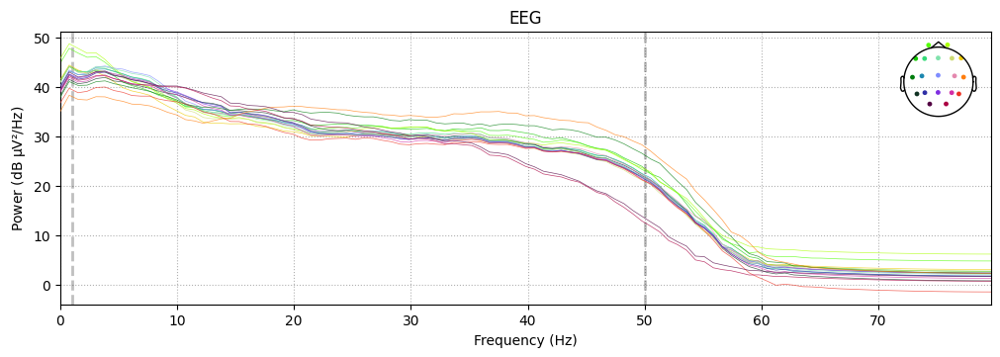

In [ ]:
epochs.plot_psd();

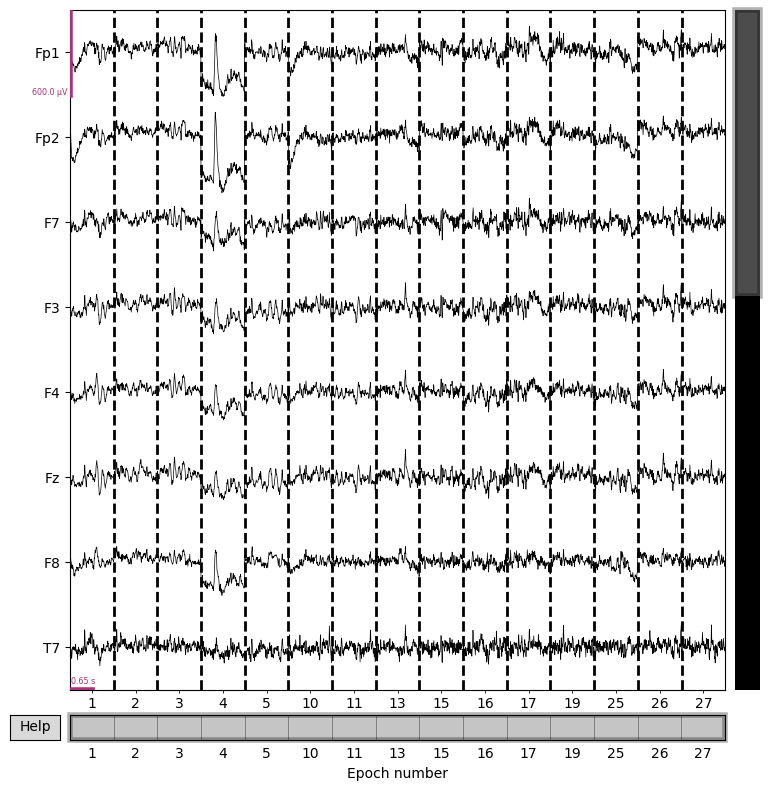

In [ ]:
epochs.plot(n_channels=8, scalings={'eeg':3e-4});

In [ ]:
epochs.event_id

{'1': 1, '2': 2, '3': 3}

In [ ]:
# check number of events of each type
# use epochs.events

# Your code here


In [ ]:
evoked_T0 = epochs['1'].average()
evoked_T1 = epochs['2'].average()
evoked_T2 = epochs['3'].average()

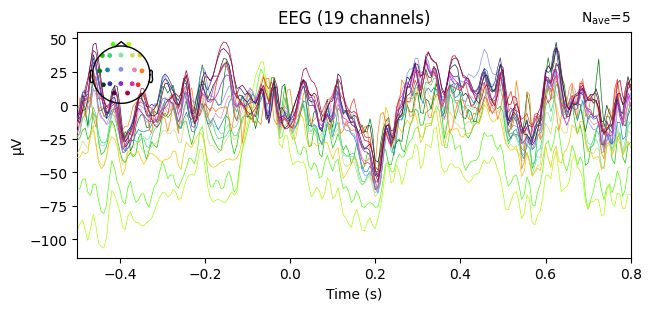

In [ ]:
evoked_T0.plot(spatial_colors=True);

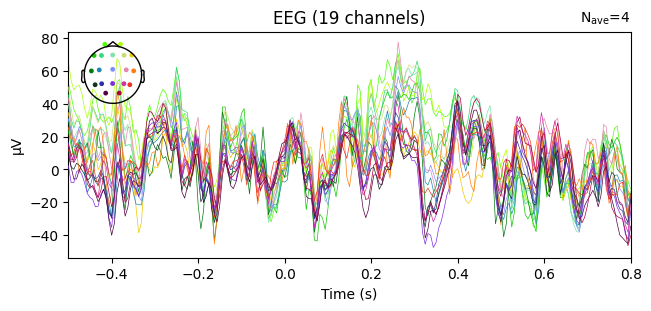

In [ ]:
evoked_T1.plot(spatial_colors=True);

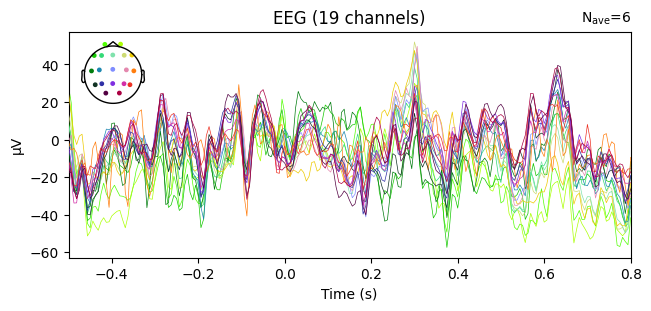

In [ ]:
evoked_T2.plot(spatial_colors=True);

## Part 2


### Independent Component Analysis for Artifact Removal

In [ ]:
ica = mne.preprocessing.ICA(n_components=10, random_state=42)

In [ ]:
ica.fit(sample_1020)

Fitting ICA to data using 19 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting by number: 10 components
Fitting ICA took 0.3s.


<ICA  |  raw data decomposition, fit (fastica): 20000 samples, 10 components, channels used: "eeg">

<IPython.core.display.Javascript object>


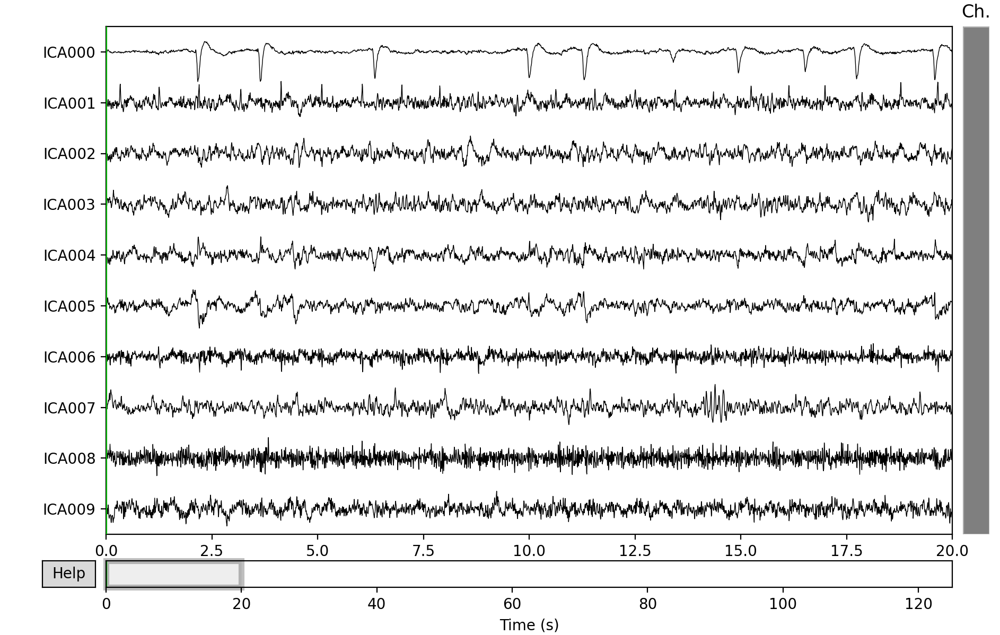

In [ ]:
ica.plot_sources(sample_1020);

<IPython.core.display.Javascript object>


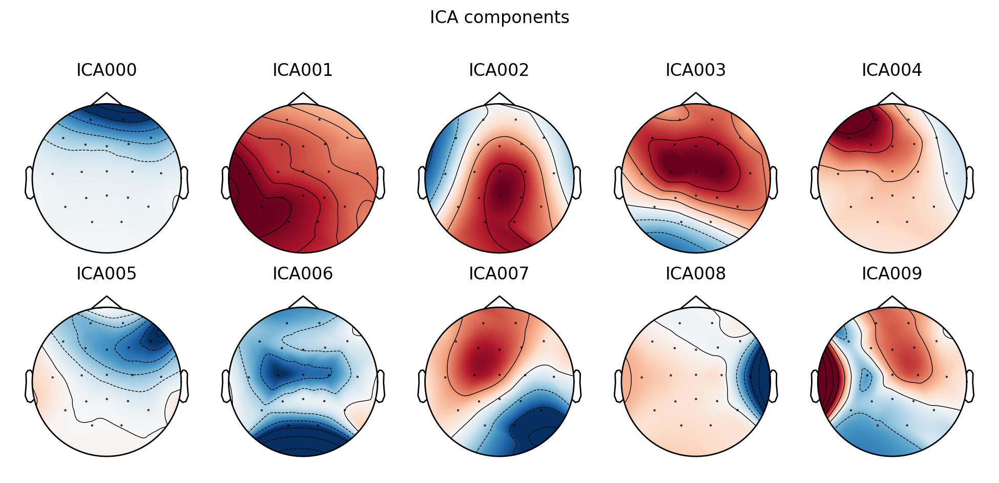

In [ ]:
ica.plot_components();

Inspect ICA components more deeply. Check out spectrogram. Segments info is not very relevant here since we build ICA on the raw data

We expect to see alpha and beta rythms picks on the spectrogram for good components (7-13 Hz and 13-30Hz respectively). And also slight decrease as frequency goes higher

<IPython.core.display.Javascript object>


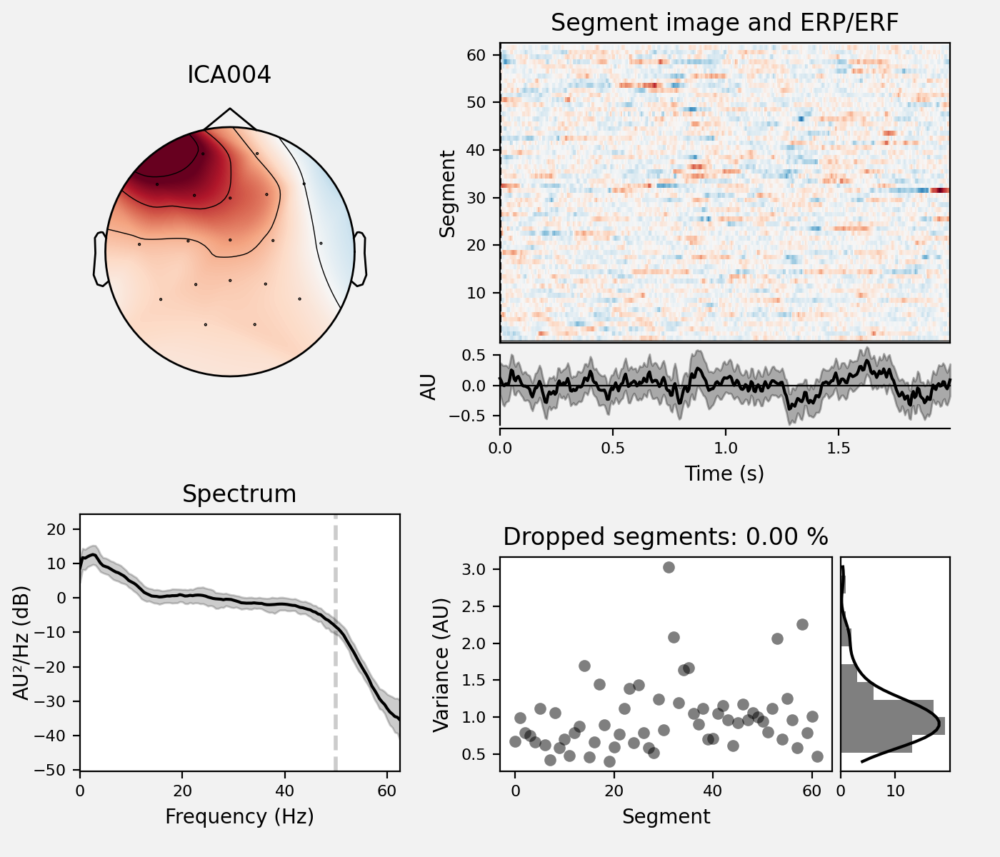

    Using multitaper spectrum estimation with 7 DPSS windows
62 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


In [ ]:
ica.plot_properties(sample_1020, picks=[4]);

Transforming to ICA space (10 components)
Zeroing out 6 ICA components


<IPython.core.display.Javascript object>


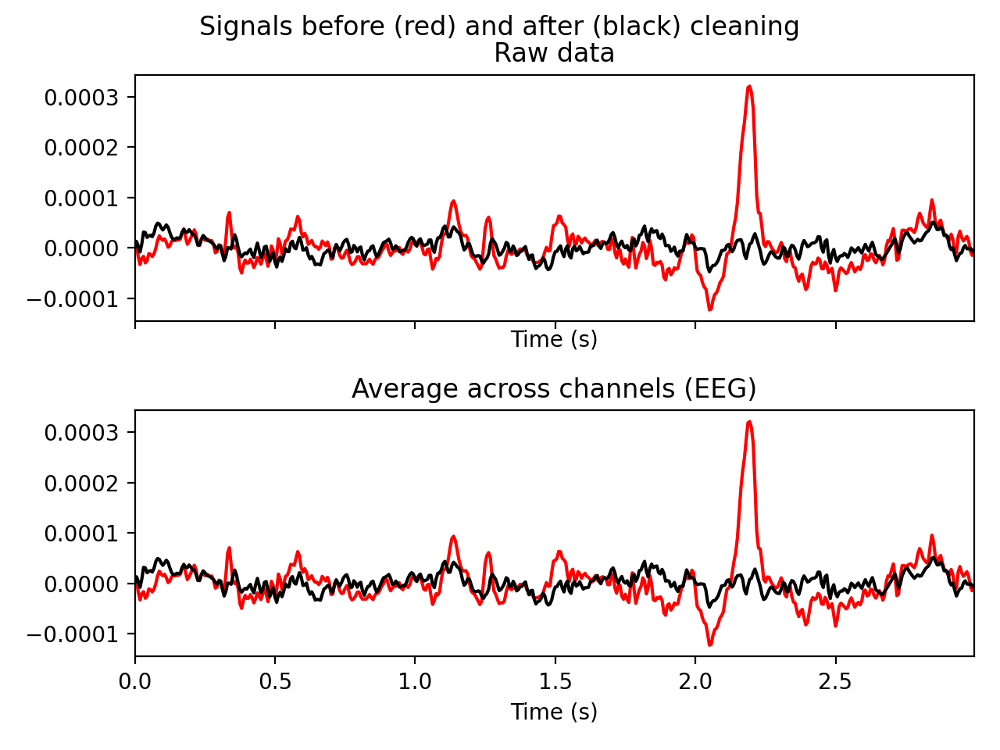

In [ ]:
ica.plot_overlay(sample_1020, exclude=[0, 1, 4, 5, 8, 9], picks=['F3']);

In [ ]:
ica.exclude = [0, 1]

In [ ]:
sample_1020_clr = sample_1020.copy()

In [ ]:
ica.apply(sample_1020_clr)

Transforming to ICA space (10 components)
Zeroing out 2 ICA components


<RawEDF | S003R03.edf, 19 x 20000 (125.0 s), ~3.0 MB, data loaded>

In [ ]:
# plot channels

# YOUR CODE HERE


In [ ]:
epochs = mne.Epochs(sample_1020_clr, events,  tmin=-0.5, tmax=0.8, reject={'eeg': 600e-6}, preload=True, baseline=(-.1, 0))


30 matching events found
Applying baseline correction (mode: mean)
Not setting metadata
0 projection items activated
Loading data for 30 events and 209 original time points ...
1 bad epochs dropped


In [ ]:
evoked_T0 = epochs['1'].average()
evoked_T1 = epochs['2'].average()
evoked_T2 = epochs['3'].average()

<IPython.core.display.Javascript object>


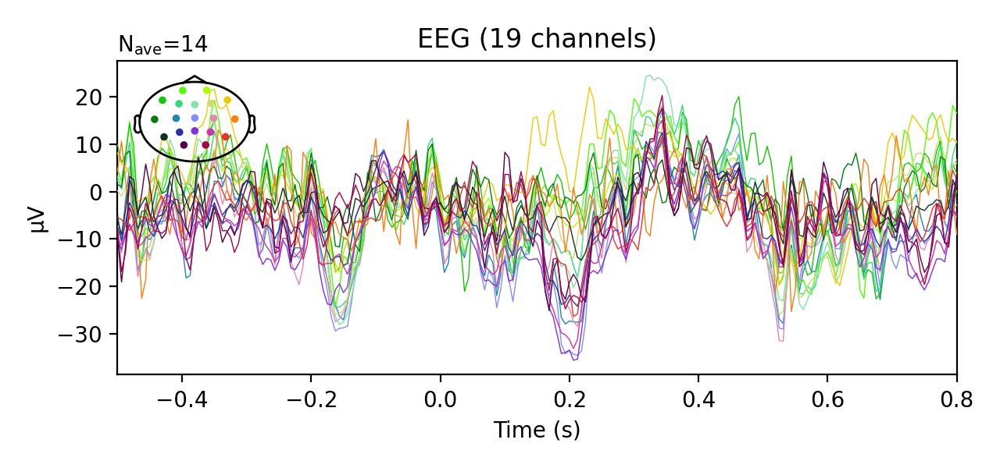

In [ ]:
evoked_T0.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


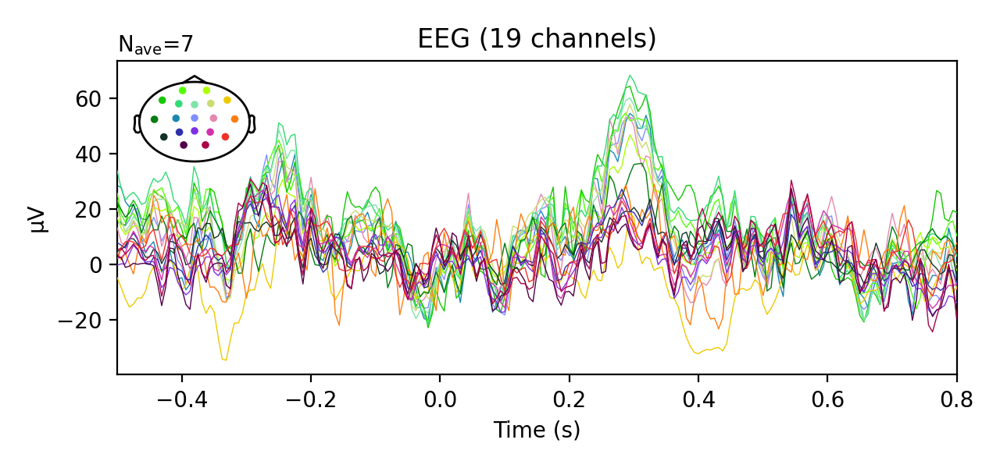

In [ ]:
evoked_T1.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


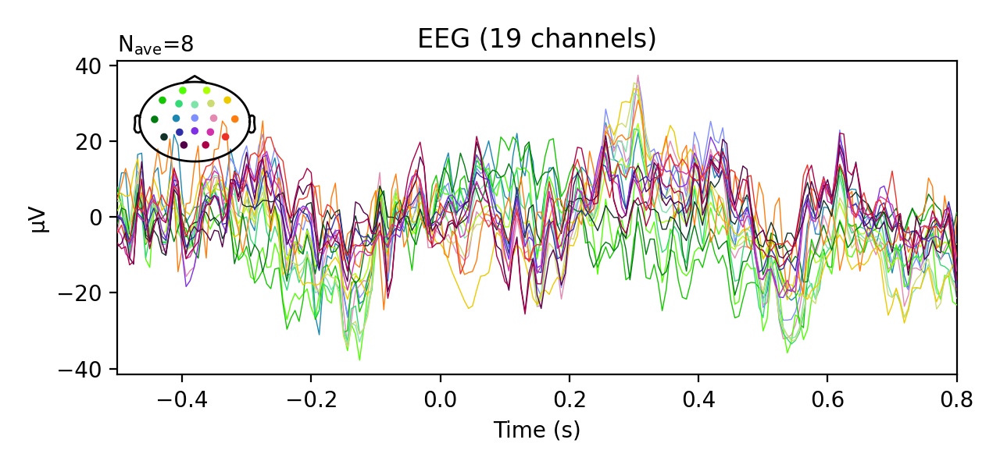

In [ ]:
evoked_T2.plot(spatial_colors=True);

<IPython.core.display.Javascript object>


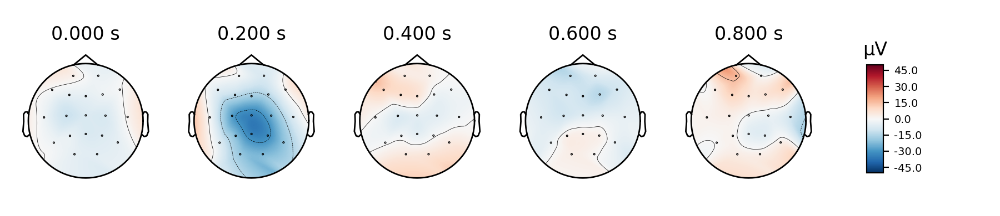

In [ ]:
evoked_T0.plot_topomap(times=[0, .2, .4, .6, .8], vmin=-50, vmax=50);

<IPython.core.display.Javascript object>


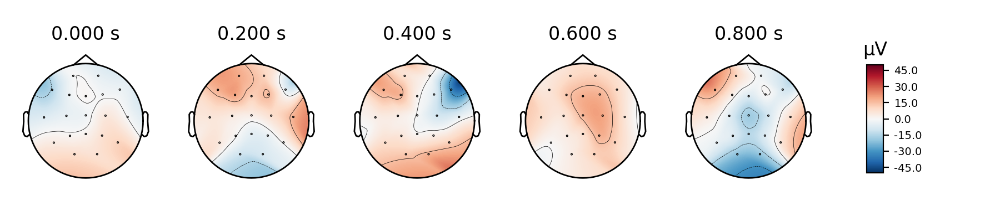

In [ ]:
evoked_T1.plot_topomap(times=[0, .2, .4, .6, .8], vmin=-50, vmax=50);

<IPython.core.display.Javascript object>


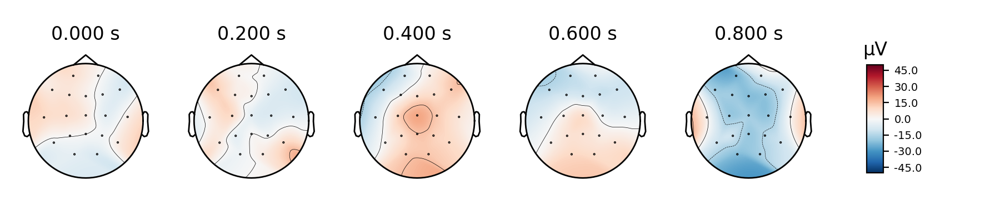

In [ ]:
evoked_T2.plot_topomap(times=[0, .2, .4, .6, .8], vmin=-50, vmax=50);

### Dynamics of alpha and beta activity

In [ ]:
evoked_T0_alpha = evoked_T0.copy().filter(l_freq=7, h_freq=13, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T1_alpha = evoked_T1.copy().filter(l_freq=7, h_freq=13, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T2_alpha = evoked_T2.copy().filter(l_freq=7, h_freq=13, method='iir', verbose=False).apply_hilbert(envelope=True)


<IPython.core.display.Javascript object>


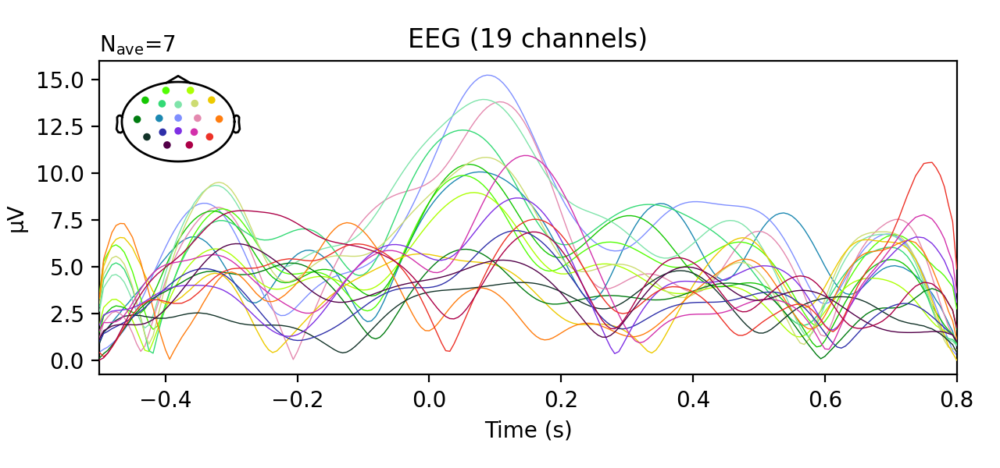

In [ ]:
evoked_T1_alpha.plot(spatial_colors=True);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


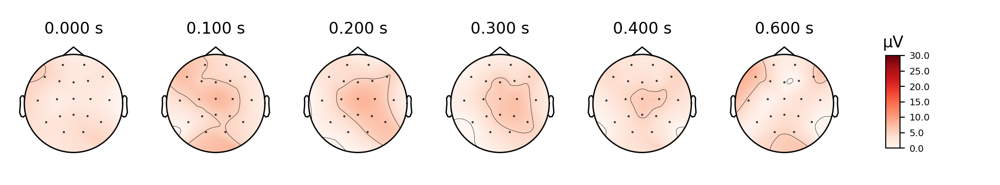

In [ ]:
evoked_T0_alpha.plot_topomap(times=[0, .1, .2, .3, .4, .6], vmin=0, vmax=30);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


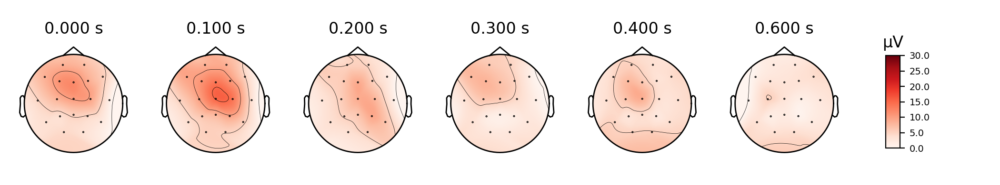

In [ ]:
evoked_T1_alpha.plot_topomap(times=[0, .1, .2, .3, .4, .6], vmin=0, vmax=30);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


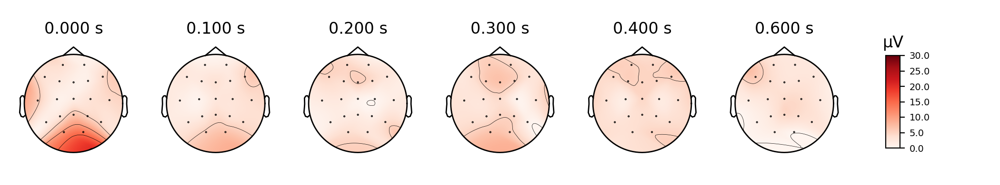

In [ ]:
evoked_T2_alpha.plot_topomap(times=[0, .1, .2, .3, .4, .6], vmin=0, vmax=30);

In [ ]:
evoked_T0_beta_low = evoked_T0.copy().filter(l_freq=13, h_freq=20, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T1_beta_low = evoked_T1.copy().filter(l_freq=13, h_freq=20, method='iir', verbose=False).apply_hilbert(envelope=True)
evoked_T2_beta_low = evoked_T2.copy().filter(l_freq=13, h_freq=20, method='iir', verbose=False).apply_hilbert(envelope=True)


/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


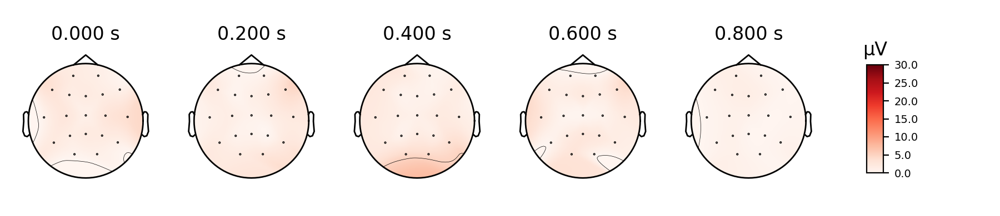

In [ ]:
evoked_T0_beta_low.plot_topomap(times=[0, .2, .4, .6, .8], vmin=0, vmax=30);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


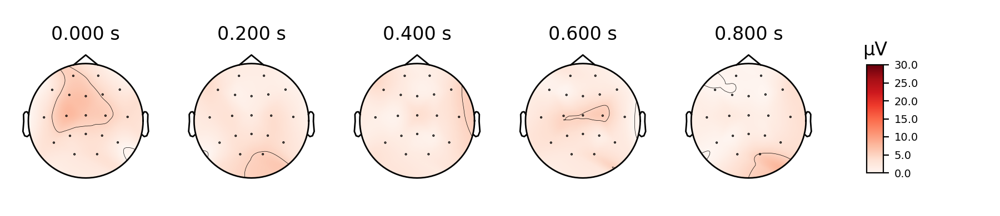

In [ ]:
evoked_T1_beta_low.plot_topomap(times=[0, .2, .4, .6, .8], vmin=0, vmax=30);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/mne/viz/utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


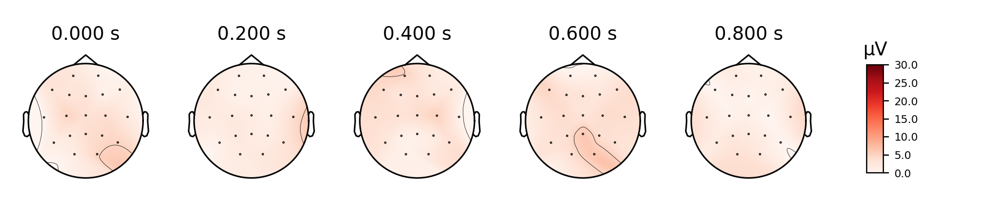

In [ ]:
evoked_T2_beta_low.plot_topomap(times=[0, .2, .4, .6, .8], vmin=0, vmax=30);

### Computing functional connectivity

In [ ]:
conn_T1, freqs, times, _, _ = mne.connectivity.spectral_connectivity(epochs['2'], method='coh')

Connectivity computation...
only using indices for lower-triangular matrix
    computing connectivity for 171 connections
    using t=0.000s..1.300s for estimation (209 points)
    frequencies: 4.6Hz..79.6Hz (99 points)
    Using multitaper spectrum estimation with 7 DPSS windows
    the following metrics will be computed: Coherence
    computing connectivity for epoch 1
    computing connectivity for epoch 2
    computing connectivity for epoch 3
    computing connectivity for epoch 4
    computing connectivity for epoch 5
    computing connectivity for epoch 6
    computing connectivity for epoch 7
    assembling connectivity matrix (filling the upper triangular region of the matrix)
[Connectivity computation done]


In [ ]:
def plot_topomap_connectivity_2d(info, con, picks=None, pairs=None, vmin=None, vmax=None, cm=None, show_values=False, show_names=True):
    """
    Plots connectivity-like data in 2d

    Drawing every pair of channels will likely make a mess
    There are two options to avoid it:
    - provide picks
    - provide specific pairs of channels to draw
    """

    # get positions
    _, pos, _, _, _, _, _ = mne.viz.topomap._prepare_topomap_plot(info, 'eeg');

#     if picks is None and pairs is None:
#         picks = info.ch_names

    ch_names_lower = [ch.lower() for ch in info.ch_names]
    if picks:
        picks_lower = [ch.lower() for ch in picks]
    if pairs:
        pairs_lower = [tuple(sorted([ch1.lower(), ch2.lower()])) for ch1, ch2 in pairs]

    rows = []
    for idx1, ch1 in enumerate(ch_names_lower):
        for idx2, ch2 in enumerate(ch_names_lower):
            if ch1 >= ch2:
                continue
            if picks and (ch1 not in picks_lower or ch2 not in picks_lower):
                    continue
            if pairs and (ch1, ch2) not in pairs_lower:
                    continue
            rows.append((
                pos[idx1],
                pos[idx2],
                con[idx1, idx2]
            ))

    if not len(rows):
        raise ValueError('No pairs to plot')

    con_to_plot = np.array([row[2] for row in rows])
    if vmin is None:
        vmin = np.percentile(con_to_plot, 2)
    if vmax is None:
        vmax = np.percentile(con_to_plot, 98)
    norm = matplotlib.colors.Normalize(vmin=vmin, vmax=vmax)

    if cm is None:
        cm = sns.diverging_palette(240, 10, as_cmap=True)

    fig, ax = plt.subplots(figsize=[5, 5])
    mne.viz.utils.plot_sensors(info, show_names=show_names, show=False, axes=ax);
    for row in rows:
        rgba_color = cm(norm(row[2]))
        plt.plot([row[0][0], row[1][0]], [row[0][1], row[1][1]], color=rgba_color)
        if show_values:
            plt.text((row[0][0] + row[1][0]) / 2,
                     (row[0][1] + row[1][1]) / 2,
                     '{:.2f}'.format(row[2]))

In [ ]:
conn_T0, freqs, times, _, _ = mne.connectivity.spectral_connectivity(epochs['1'], method='coh', verbose=False);
conn_T1, freqs, times, _, _ = mne.connectivity.spectral_connectivity(epochs['2'], method='coh', verbose=False);
conn_T2, freqs, times, _, _ = mne.connectivity.spectral_connectivity(epochs['3'], method='coh', verbose=False);

In [ ]:
freqs

array([ 4.59330144,  5.35885167,  6.12440191,  6.88995215,  7.65550239,
        8.42105263,  9.18660287,  9.95215311, 10.71770335, 11.48325359,
       12.24880383, 13.01435407, 13.77990431, 14.54545455, 15.31100478,
       16.07655502, 16.84210526, 17.6076555 , 18.37320574, 19.13875598,
       19.90430622, 20.66985646, 21.4354067 , 22.20095694, 22.96650718,
       23.73205742, 24.49760766, 25.26315789, 26.02870813, 26.79425837,
       27.55980861, 28.32535885, 29.09090909, 29.85645933, 30.62200957,
       31.38755981, 32.15311005, 32.91866029, 33.68421053, 34.44976077,
       35.215311  , 35.98086124, 36.74641148, 37.51196172, 38.27751196,
       39.0430622 , 39.80861244, 40.57416268, 41.33971292, 42.10526316,
       42.8708134 , 43.63636364, 44.40191388, 45.16746411, 45.93301435,
       46.69856459, 47.46411483, 48.22966507, 48.99521531, 49.76076555,
       50.52631579, 51.29186603, 52.05741627, 52.82296651, 53.58851675,
       54.35406699, 55.11961722, 55.88516746, 56.6507177 , 57.41

In [ ]:
conn_T0_beta = conn_T0[:, :, 12:27].mean(axis=2)
conn_T0_beta = conn_T0_beta + conn_T0_beta.T

conn_T1_beta = conn_T1[:, :, 12:27].mean(axis=2)
conn_T1_beta = conn_T1_beta + conn_T1_beta.T

conn_T2_beta = conn_T2[:, :, 12:27].mean(axis=2)
conn_T2_beta = conn_T2_beta + conn_T2_beta.T

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/ipykernel_launcher.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


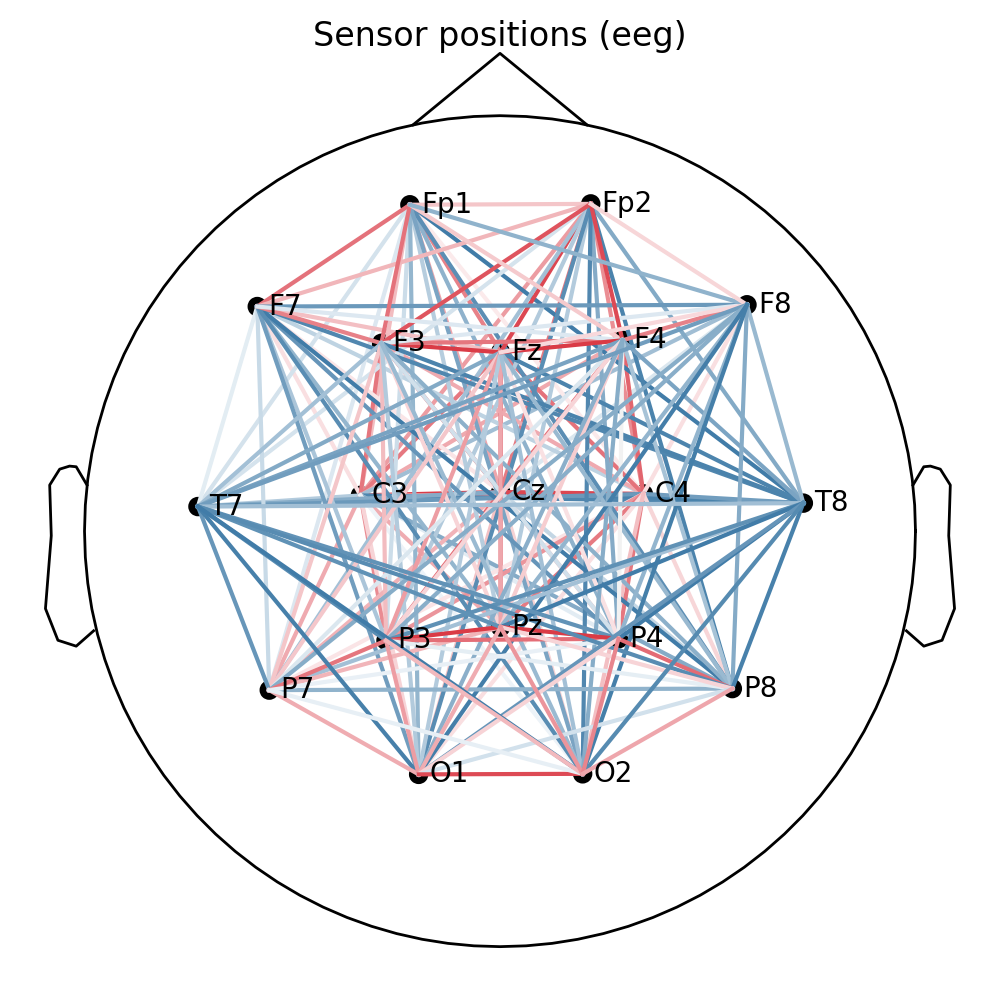

In [ ]:
plot_topomap_connectivity_2d(epochs.info, conn_T1_beta, picks=epochs.ch_names);

/home/ledovsky/anaconda3/envs/eeg/lib/python3.7/site-packages/ipykernel_launcher.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


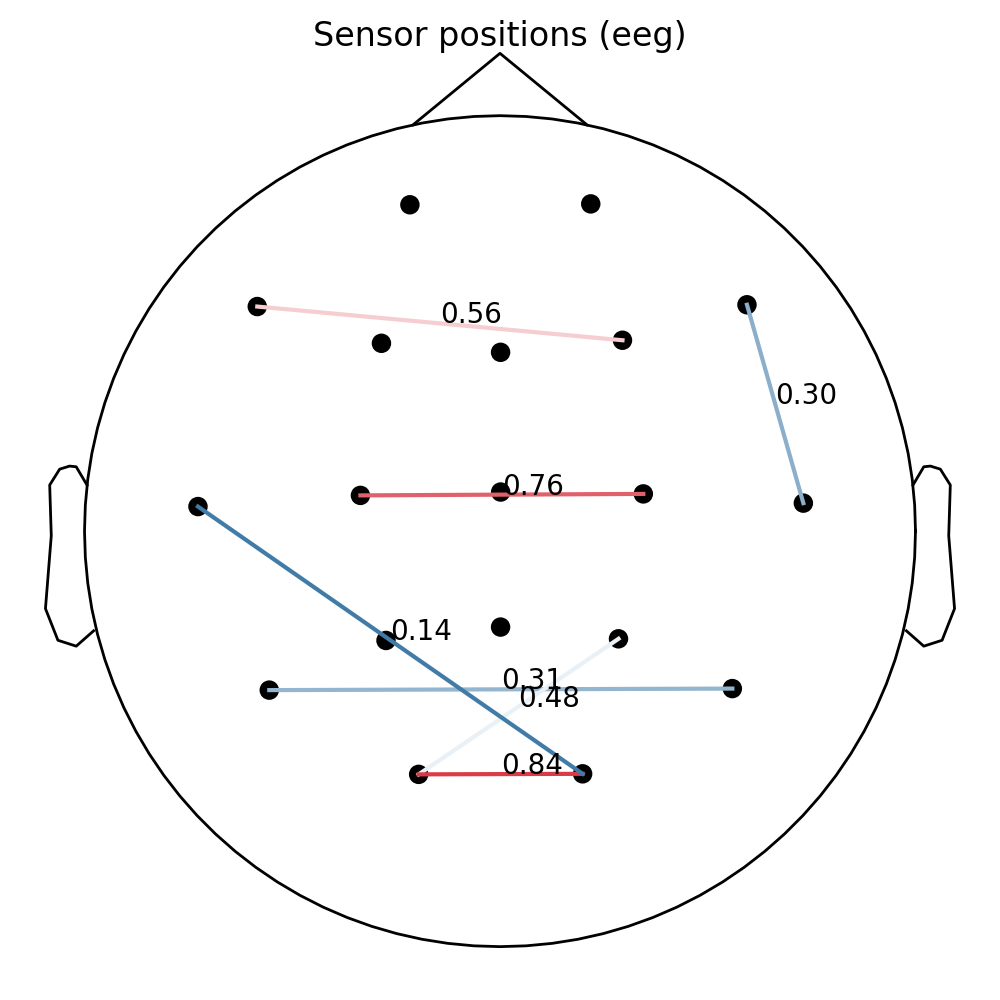

In [ ]:
plot_topomap_connectivity_2d(epochs.info, conn_T0_beta,
                             pairs=[('F7', 'F4'), ('O2', 'T7'), ('C3', 'C4'), ('P7', 'P8'), ('F8', 'T8'), ('O1', 'O2'), ('O1', 'P4')],
                             show_values=True,
                             show_names=False

                            );


In [ ]:
# calculate coherence in alpha band
# plot 5-10 pairs that you are interested in

# YOUR CODE HERE